In [0]:
from pyspark.sql import *
from pyspark.sql.functions import *
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
#import geopandas as gpd
#from geopandas import GeoDataFrame
import plotly.express as px

df_mental = spark.read.csv("dbfs:/FileStore/mental_illness", header=True)
df_ufo = spark.read.csv("dbfs:/FileStore/ufo_sightings", header=True)

display(df_mental)
display(df_ufo)

index,Entity,Code,Year,Schizophrenia (%),Bipolar disorder (%),Eating disorders (%),Anxiety disorders (%),Drug use disorders (%),Depression (%),Alcohol use disorders (%)
0,Afghanistan,AFG,1990,0.16056,0.697779,0.101855,4.82883,1.677082,4.071831,0.672404
1,Afghanistan,AFG,1991,0.160312,0.697961,0.099313,4.82974,1.684746,4.079531,0.671768
2,Afghanistan,AFG,1992,0.160135,0.698107,0.096692,4.831108,1.694334,4.088358,0.670644
3,Afghanistan,AFG,1993,0.160037,0.698257,0.094336,4.830864,1.70532,4.09619,0.669738
4,Afghanistan,AFG,1994,0.160022,0.698469,0.092439,4.829423,1.716069,4.099582,0.66926
5,Afghanistan,AFG,1995,0.160076,0.698695,0.09098,4.828337,1.728112,4.104207,0.668746
6,Afghanistan,AFG,1996,0.160249,0.698914,0.089709,4.828083,1.737643,4.1075,0.667727
7,Afghanistan,AFG,1997,0.160554,0.699127,0.088372,4.827726,1.746891,4.110834,0.66622
8,Afghanistan,AFG,1998,0.160931,0.699372,0.08733,4.826971,1.756963,4.114438,0.664676
9,Afghanistan,AFG,1999,0.161311,0.699674,0.086267,4.826413,1.770791,4.117633,0.663428


City,State,Country,Shape,Duration,Summary,Posted,Images,Date/Time,Month,Year
east ridge (chatanooga),tn,usa,circle,not available,"I saw six, light orange, very bright and large sized round objects, moving from east to west, from East Ridge,Tn. at 1:15AM.",01/01/14,no,2014-01-01T01:15:00.000Z,01,2014
indianapolis,in,usa,changing,4 minutes,"Just saw a very strange sight. A group of bright blue and neon orange orbs floated over my house. They seemed to be at least 15,000 f",8/24/13,no,2013-08-24T18:04:00.000Z,08,2013
evansville,in,usa,not available,not available,MADAR Node 153,06/07/19,no,2019-06-07T18:21:00.000Z,06,2019
round rock,tx,usa,light,10 seconds,Two white orbs flying low and fast across the sky disappeared after approx. 10 seconds.,07/12/14,no,2014-07-12T21:30:00.000Z,07,2014
orlando,fl,usa,triangle,30 seconds,Perfectly shaped black triangles flying low over Orlando tourist area.,2/16/03,no,2003-02-16T20:00:00.000Z,02,2003
kent,wa,usa,light,2 seconds,orange orb,2/16/09,no,2009-02-16T02:00:00.000Z,02,2009
duncanville,tx,usa,egg,5min,red orbs going west very fast whistling,04/01/04,no,2004-04-01T18:00:00.000Z,04,2004
springfield,nh,usa,triangle,2 minutes,"Three white lights seen over I-91 in Springfield, NH",12/11/10,no,2010-12-11T19:00:00.000Z,12,2010
oakdale,ny,usa,disk,45 seconds,"""Three highly luminesce objects in a """"V"""" formation gliding through the black night sky.""",7/15/54,no,1954-07-15T21:00:00.000Z,07,1954
logansport,in,usa,triangle,5 minutes,Driving to work and stopped at the gas station. The red lights were in the shape of a triangle and just hovering.,7/19/14,no,2014-07-19T05:00:00.000Z,07,2014


In [0]:
df_mental_usa = df_mental.filter(df_mental.Code == "USA")


df_mental_usa.withColumn("Schizophrenia (%)", col('Schizophrenia (%)').cast('double'))
# s = df_mental_usa.select('Year', 'Schizophrenia (%)').sample(False, 0, 0).toPandas()
# plt.scatter(s.x, s.y)
# plx.xlabel('Year')
# plt.ylabel('Schizophrenia (%)')
# plt.show()
display(df_mental_usa)
# df_mental_usa.printSchema()

index,Entity,Code,Year,Schizophrenia (%),Bipolar disorder (%),Eating disorders (%),Anxiety disorders (%),Drug use disorders (%),Depression (%),Alcohol use disorders (%)
6076,United States,USA,1990,0.340897,0.653706,0.468676,6.576884,2.367794,4.677591,2.173751
6077,United States,USA,1991,0.338913,0.653953,0.473575,6.553351,2.345466,4.660871,2.139292
6078,United States,USA,1992,0.337343,0.654205,0.47861,6.536143,2.339515,4.651949,2.107931
6079,United States,USA,1993,0.336207,0.654431,0.483539,6.525536,2.347095,4.648701,2.080669
6080,United States,USA,1994,0.335536,0.65462,0.488235,6.522278,2.365738,4.649294,2.058632
6081,United States,USA,1995,0.335363,0.654721,0.492368,6.526489,2.392582,4.650869,2.042931
6082,United States,USA,1996,0.335806,0.654749,0.496752,6.578023,2.456048,4.662902,2.033987
6083,United States,USA,1997,0.336797,0.65472,0.50156,6.688847,2.564591,4.689154,2.03059
6084,United States,USA,1998,0.338085,0.654658,0.506483,6.818473,2.688823,4.720716,2.031176
6085,United States,USA,1999,0.33941,0.654564,0.511072,6.926351,2.800595,4.749991,2.034175


Out[19]: <AxesSubplot:title={'center':'UFO sighting reports per year'}, xlabel='year(Date/Time)'>

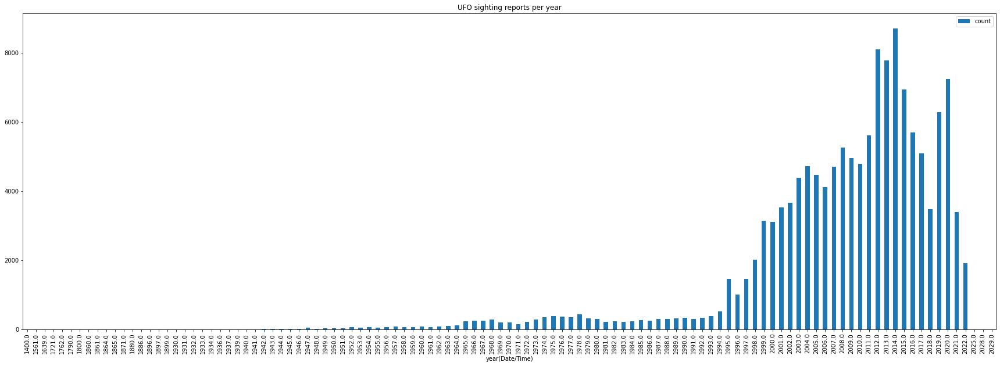

In [0]:
df_countByYear = df_ufo.groupBy(year("Date/Time")).count().sort(col("count").desc())\
        .withColumn('%', col('count')/sum('count').over(Window.partitionBy())*100)\
        .withColumn("%", round("%", 2))

df_countByYear = df_countByYear.toPandas()
df_countByYear.groupby(["year(Date/Time)"]).sum().plot(figsize=(30,10), kind='bar', y="count", title="UFO sighting reports per year")

In [0]:
df2 = df_ufo.groupBy(upper("Country").alias("Country"))\
        .count().sort(col("count").desc())\
        .withColumn('%', col('count')/sum('count').over(Window.partitionBy())*100)\
        .withColumn("%", round("%", 2))

fig = px.choropleth(df2.toPandas(), locations='Country', locationmode="ISO-3", scope="world", color='count', color_continuous_scale="thermal")
fig.show()

In [0]:
df2 = df_ufo.filter(df_ufo.Country == "usa")\
        .groupBy(upper("State").alias("State"))\
        .count().sort(col("count").desc())\
        .withColumn('%', col('count')/sum('count').over(Window.partitionBy())*100)\
        .withColumn("%", round("%", 2))


fig = px.choropleth(df2.toPandas(), locations='State', locationmode="USA-states", scope="usa", color='count', color_continuous_scale="blackbody")
fig.show()

Out[22]: <AxesSubplot:title={'center':'Number of UFO reports for each month'}, xlabel='month(Date/Time)'>

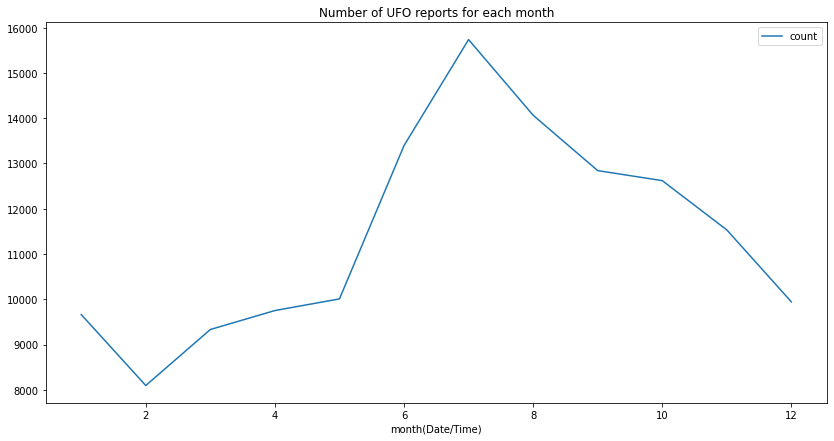

In [0]:
w = Window.partitionBy("month(Date/Time)")
df2 = df_ufo.groupBy(month("Date/Time")).count().sort(col("month(Date/Time)").desc())#obrisao sam on maxcount 3 linije

df2 = df2.toPandas()
df2.groupby(["month(Date/Time)"]).sum().plot(figsize=(14,7), y="count", kind='line', title="Number of UFO reports for each month")

Out[23]: <AxesSubplot:title={'center':'Report contains images'}, ylabel='%'>

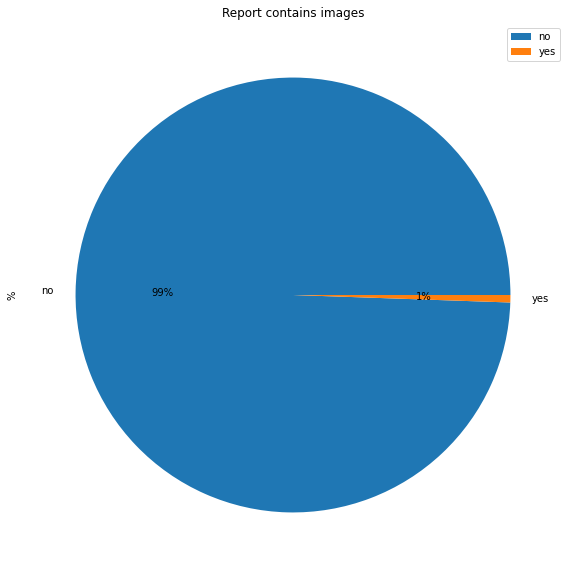

In [0]:
df2 = df_ufo.groupBy("Images").count().sort(col("count").desc())\
        .withColumn('%', col('count')/sum('count').over(Window.partitionBy())*100)\
        .withColumn("%", round("%", 2))

#display(df2)
df2 = df2.toPandas()
df2.groupby(["Images"]).sum().plot(figsize=(10,10), kind='pie', y="%", autopct='%1.0f%%', title="Report contains images")

Out[24]: <AxesSubplot:title={'center':'UFO sighting reports per century'}, ylabel='%'>

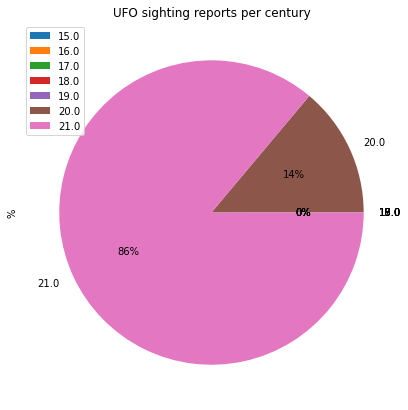

In [0]:
df2 = df_ufo.withColumn("Century", (year("Date/Time").substr(1,2)+lit(1)).cast("int"))\
        .groupBy("Century").count().sort(col("count").desc())\
        .withColumn('%', col('count')/sum('count').over(Window.partitionBy())*100)\
        .withColumn("%", round("%", 3))

#df2.groupby("Century").sum().plot(kind='pie', y='%')

df2 = df2.toPandas()
df2.groupby(["Century"]).sum().plot(figsize=(14,7), kind='pie', y="%", autopct='%1.0f%%', title="UFO sighting reports per century")

Out[25]: <AxesSubplot:title={'center':'Most common UFO shape'}, ylabel='%'>

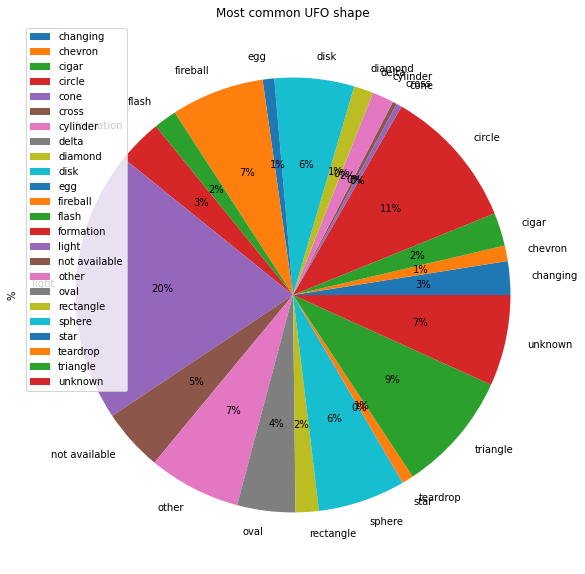

In [0]:
# import plotly.graph_objs as gr
# import plotly.plotly as py
# plot = df_ufo.groupBy('Shape').count().orderBy(df_ufo.Shape.desc()).toPandas()
# plot = plot.sort_values(by=['count'], ascending=False).head(20)

# data = [gr.Bar(x=plot['Shape'], y=plot['count'])]
# py.iplot(data, filename='basic-bar')

df2 = df_ufo.groupBy("Shape").count().sort(col("count").desc())\
        .withColumn('%', col('count')/sum('count').over(Window.partitionBy())*100)\
        .withColumn("%", round("%", 2))

#display(df2)
df2 = df2.toPandas()
df2.groupby(["Shape"]).sum().plot(figsize=(10,10), kind='pie', y="%", autopct='%1.0f%%', title="Most common UFO shape")

Out[26]: <AxesSubplot:title={'center':'Most common reported UFO shape by state.'}, xlabel='State,Shape'>

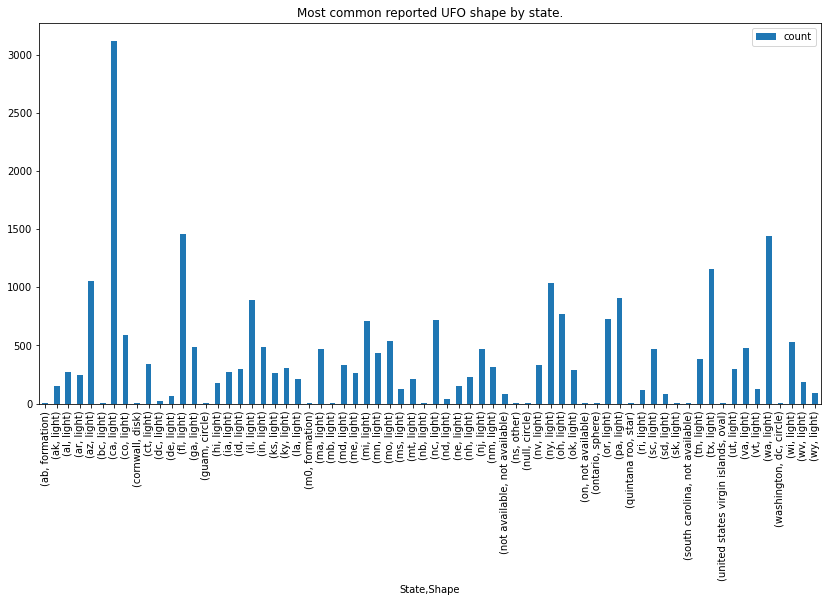

In [0]:
w = Window.partitionBy("State")
df2 = df_ufo.filter(df_ufo.Country == "usa")\
        .groupBy("State", "Shape").count().sort(col("State").desc())\
        .withColumn("maxCount", max('count').over(w))\
        .where(col('count') == col('maxCount'))\
        .drop('maxCount')

df2 = df2.toPandas()
df2.groupby(["State", "Shape"]).sum().plot(figsize=(14,7), kind='bar', title="Most common reported UFO shape by state.")

Hipoteza 1: Sto je veca stopa zastupljenosti sizofrenije, to vise ima prijava o vidjenju nepoznatih letecih objekata.

In [0]:
Hipoteza 2: Broj prijava raste zajedno sa stopom zastupljenosti mentalnih bolesti u Sjedinjenim Americkim Drzavama.